<h1><center>Capstone Project_The Battle of Neighborhood</center></h1>

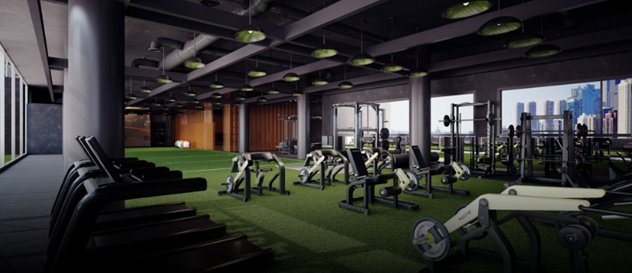

## Introduction:

Note: Throughout the project, I use "All Fit YK Center1" which is a fictitious business name chosen for this capstone project.

Each year, millions of people join fitness centers to get fit and lose weight. The global health club industry rakes in a cool 85 billion USD each year. American fitness centers alone enjoy a market size of just under 26 billion USD a year and they’re not struggling for customers, either. Approximately one in six adults have got at least one gym membership. But just because the market is great does not mean you should dive into the industry without doing a bit of research and planning.

Opening a fitness center could potentially be a great business opportunity, but there are quite a few factors you’ll need to bear in mind before you’re ready to start up. One key factor is the strategic location to attract members.

The location will most likely be a key factor within your business plan since location is often critical to its survival. First and foremost, you’ll want to do a bit of market research about:
1.	What is/are the best locations for the fitness center in New York City.
2.	Analyze existing fitness centers (like Gyms, Gyms/Fitness. Yoga Studio) and their locations.

New York City is a major center for banking and finance, retailing, world trade, transportation, tourism, real estate, new media, traditional media, advertising, legal services, accountancy, insurance, theater, fashion, and the arts in the United States. And also, it is the most populous city in the United States, one of the greatest metropolises over the world, is a dream place for the millennials.

## Importing all necessary libraries for the project

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.5.0 --yes
import folium # map rendering library

print('All libraries imported were imported for project.')

Solving environment: done

## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs:
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    geographiclib-1.50         |             py_0          34 KB  conda-forge
    geopy-1.21.0               |             py_0          58 KB  conda-forge
    ------------------------------------------------------------
                                           Total:          92 KB

The following NEW packages will be INSTALLED:

  geographiclib      conda-forge/noarch::geographiclib-1.50-py_0
  geopy              conda-forge/noarch::geopy-1.21.0-py_0



geopy-1.21.0         | 58 KB     | ##################################### | 100% 
geographiclib-1.50   | 34 KB     | ##################################### | 100% 
Preparing transaction: done
Verifying transaction: done
Executing transaction: done
Sol

## Newtork City Neighbourhood data

In [2]:
!wget -q -O 'newyork_data.json' https://cocl.us/new_york_dataset
print('Data downloaded!')

Data downloaded!


In [3]:
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

In [4]:
newyork_data

{'type': 'FeatureCollection',
 'totalFeatures': 306,
 'features': [{'type': 'Feature',
   'id': 'nyu_2451_34572.1',
   'geometry': {'type': 'Point',
    'coordinates': [-73.84720052054902, 40.89470517661]},
   'geometry_name': 'geom',
   'properties': {'name': 'Wakefield',
    'stacked': 1,
    'annoline1': 'Wakefield',
    'annoline2': None,
    'annoline3': None,
    'annoangle': 0.0,
    'borough': 'Bronx',
    'bbox': [-73.84720052054902,
     40.89470517661,
     -73.84720052054902,
     40.89470517661]}},
  {'type': 'Feature',
   'id': 'nyu_2451_34572.2',
   'geometry': {'type': 'Point',
    'coordinates': [-73.82993910812398, 40.87429419303012]},
   'geometry_name': 'geom',
   'properties': {'name': 'Co-op City',
    'stacked': 2,
    'annoline1': 'Co-op',
    'annoline2': 'City',
    'annoline3': None,
    'annoangle': 0.0,
    'borough': 'Bronx',
    'bbox': [-73.82993910812398,
     40.87429419303012,
     -73.82993910812398,
     40.87429419303012]}},
  {'type': 'Feature',
 

In [5]:
neighborhoods_data = newyork_data['features']
neighborhoods_data[0]

{'type': 'Feature',
 'id': 'nyu_2451_34572.1',
 'geometry': {'type': 'Point',
  'coordinates': [-73.84720052054902, 40.89470517661]},
 'geometry_name': 'geom',
 'properties': {'name': 'Wakefield',
  'stacked': 1,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'annoangle': 0.0,
  'borough': 'Bronx',
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661]}}

## Convert the NYC raw data into data frame

In [6]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neigh_df = pd.DataFrame(columns=column_names)

In [7]:
for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neigh_df = neigh_df.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [8]:
neigh_df.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [9]:
neigh_df.shape

(306, 4)

## Visualize the NYC Neighbourhood data

In [10]:
# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

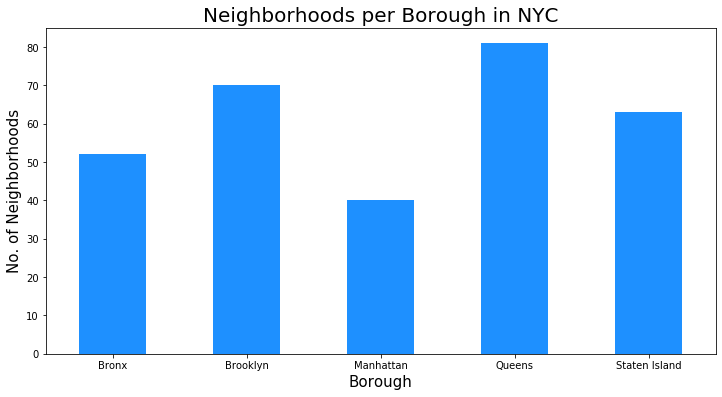

In [11]:
clr_b = "dodgerblue"
neigh_df.groupby('Borough')['Neighborhood'].count().plot.bar(figsize=(12,6), color=clr_b)
plt.title('Neighborhoods per Borough in NYC', fontsize = 20)
plt.xlabel('Borough', fontsize = 15)
plt.ylabel('No. of Neighborhoods',fontsize = 15)
plt.xticks(rotation = 'horizontal')

plt.show()

## Calling Venue Category from Foursquare API

In [12]:
CLIENT_ID = 'H54J5T0LXUYL43EQVCKGSMI2WCATKQBRS2KLW3VSVUKZQKE2' # your Foursquare ID
CLIENT_SECRET = 'LELLHLZQS5OVKJBLPU2K0LKLF53TJXKDKJ3YCOW1RGZJ1VHG' # your Foursquare Secret
ACCESS_TOKEN = '30D0H2Y04AUJJEXFH1MZ1G5BHGERGBQ5FKPAPIHFFB0CZDGC'
VERSION = '20200105' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: H54J5T0LXUYL43EQVCKGSMI2WCATKQBRS2KLW3VSVUKZQKE2
CLIENT_SECRET:LELLHLZQS5OVKJBLPU2K0LKLF53TJXKDKJ3YCOW1RGZJ1VHG


In [13]:
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 500 # define radius

# create URL
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
      CLIENT_ID, 
      CLIENT_SECRET, 
      VERSION, 
      neighborhood_lat, 
     neighborhood_lon, 
     radius, 
     LIMIT)
url # display URL

'https://api.foursquare.com/v2/venues/explore?&client_id=H54J5T0LXUYL43EQVCKGSMI2WCATKQBRS2KLW3VSVUKZQKE2&client_secret=LELLHLZQS5OVKJBLPU2K0LKLF53TJXKDKJ3YCOW1RGZJ1VHG&v=20200105&ll=40.61731079252983,-74.08173992211962&radius=500&limit=100'

In [14]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
        
        #url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.format(
    #CLIENT_ID, CLIENT_SECRET, lat, lng, VERSION, query_gym, radius, LIMIT)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
           VERSION, 
           lat, 
           lng, 
           radius, 
           LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'],   
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [16]:
ny_venues = getNearbyVenues(names=neigh_df['Neighborhood'],
                                   latitudes=neigh_df['Latitude'],
                                   longitudes=neigh_df['Longitude']
                                  )

Wakefield
Co-op City
Eastchester
Fieldston
Riverdale
Kingsbridge
Marble Hill
Woodlawn
Norwood
Williamsbridge
Baychester
Pelham Parkway
City Island
Bedford Park
University Heights
Morris Heights
Fordham
East Tremont
West Farms
High  Bridge
Melrose
Mott Haven
Port Morris
Longwood
Hunts Point
Morrisania
Soundview
Clason Point
Throgs Neck
Country Club
Parkchester
Westchester Square
Van Nest
Morris Park
Belmont
Spuyten Duyvil
North Riverdale
Pelham Bay
Schuylerville
Edgewater Park
Castle Hill
Olinville
Pelham Gardens
Concourse
Unionport
Edenwald
Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker

In [17]:
print(ny_venues.shape)
ny_venues.head()

(9826, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop
2,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy
3,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy
4,Wakefield,40.894705,-73.847201,Dunkin',40.890459,-73.849089,Donut Shop


In [18]:
ny_venues.to_csv('ny_venues.csv') # Save the information so far to a .csv file due to limited calls on FourSquare

## Merging Neighbourhood data and Foursquare data into one data frame

In [12]:
df = pd.read_csv('ny_venues.csv')
df.drop(['Unnamed: 0'], axis=1, inplace=True)
df.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop
2,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy
3,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy
4,Wakefield,40.894705,-73.847201,Dunkin',40.890459,-73.849089,Donut Shop


In [13]:
ny_venues=df.merge(neigh_df, on='Neighborhood', how='left')
ny_venues.drop(['Latitude','Longitude'], axis=1, inplace=True)
ny_venues.rename(columns={'Venue Category':'Venue_Category'}, inplace=True) 

In [14]:
ny_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue_Category,Borough
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop,Bronx
1,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop,Bronx
2,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy,Bronx
3,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy,Bronx
4,Wakefield,40.894705,-73.847201,Dunkin',40.890459,-73.849089,Donut Shop,Bronx


In [15]:
ny_venues.sort_values(by=['Venue_Category'], inplace=True)
ny_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue_Category,Borough
4235,Lincoln Square,40.773529,-73.985338,Kangol,40.775428,-73.980357,Accessories Store,Manhattan
396,Fordham,40.860997,-73.896427,Claire's,40.861917,-73.895524,Accessories Store,Bronx
7001,Rosedale,40.659816,-73.735261,Sunglass Hut,40.655864,-73.732963,Accessories Store,Queens
2238,Park Slope,40.672321,-73.977050,Sounds,40.672450,-73.976784,Accessories Store,Brooklyn
7140,Bay Terrace,40.782843,-73.776802,Claire's,40.778900,-73.778137,Accessories Store,Staten Island


## Combining Gym and Gym/Fitness center into one venue category

In [16]:
ny_venues1=ny_venues.replace(to_replace ="Gym / Fitness Center", 
                 value ="Gym")

In [21]:
ny_venues1.groupby('Venue_Category').count()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Borough
Venue_Category,,,,,,,
Accessories Store,7,7,7,7,7,7,7
Adult Boutique,1,1,1,1,1,1,1
Afghan Restaurant,3,3,3,3,3,3,3
African Restaurant,4,4,4,4,4,4,4
Airport Terminal,1,1,1,1,1,1,1
American Restaurant,156,156,156,156,156,156,156
Animal Shelter,1,1,1,1,1,1,1
Antique Shop,9,9,9,9,9,9,9
Arcade,3,3,3,3,3,3,3


## Creating a new data frame with only fitness venue catogeries

In [22]:
All_Fit_Gym = ['Yoga Studio', 'Gym', 'Gymnastics Gym', 'Boxing Gym', 'Climbing Gym', 'Yoga Studio']

In [23]:
df_final= ny_venues1[ny_venues1['Venue_Category'].isin(All_Fit_Gym)]
df_final.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue_Category,Borough
2527,Clinton Hill,40.693229,-73.967843,CKO Kickboxing,40.696496,-73.968389,Boxing Gym,Brooklyn
4407,Midtown,40.754691,-73.981669,Everybody Fights,40.752087,-73.979450,Boxing Gym,Manhattan
9219,Turtle Bay,40.752042,-73.967708,iLoveKickboxing,40.750580,-73.971540,Boxing Gym,Manhattan
4536,Murray Hill,40.748303,-73.978332,Everybody Fights,40.752087,-73.979450,Boxing Gym,Manhattan
2661,Downtown,40.690844,-73.983463,iLoveKickboxing,40.688255,-73.982155,Boxing Gym,Brooklyn


In [24]:
df_final.groupby('Venue_Category').count()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Borough
Venue_Category,,,,,,,
Boxing Gym,16,16,16,16,16,16,16
Climbing Gym,3,3,3,3,3,3,3
Gym,241,241,241,241,241,241,241
Gymnastics Gym,4,4,4,4,4,4,4
Yoga Studio,76,76,76,76,76,76,76


In [25]:
df_final.tail()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue_Category,Borough
6031,Forest Hills,40.725264,-73.844475,Zen and Yoga,40.720789,-73.844501,Yoga Studio,Queens
6037,Forest Hills,40.725264,-73.844475,bambooYOGA,40.721341,-73.844976,Yoga Studio,Queens
4228,Lincoln Square,40.773529,-73.985338,CorePower Yoga,40.776861,-73.981803,Yoga Studio,Manhattan
1273,Greenpoint,40.730201,-73.954241,Maha Rose,40.733529,-73.957473,Yoga Studio,Brooklyn
8635,Civic Center,40.715229,-74.005415,Lyons Den Power Yoga,40.718872,-74.004989,Yoga Studio,Manhattan


In [26]:
df_final.shape

(340, 8)

## Fitness Venue Category count

In [27]:
df_final.groupby('Venue_Category').count()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Borough
Venue_Category,,,,,,,
Boxing Gym,16,16,16,16,16,16,16
Climbing Gym,3,3,3,3,3,3,3
Gym,241,241,241,241,241,241,241
Gymnastics Gym,4,4,4,4,4,4,4
Yoga Studio,76,76,76,76,76,76,76


## Exploratory Data Analysis for the Gym Category

In [28]:
df_gym = df_final[(df_final.Venue_Category == "Gym")]
df_gym.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue_Category,Borough
10026,Hudson Yards,40.756658,-74.000111,505W37 Gym,40.757275,-73.997797,Gym,Manhattan
9432,Flatiron,40.739673,-73.990947,New York Health and Racquet Club,40.739144,-73.987345,Gym,Manhattan
658,Parkchester,40.837938,-73.856003,Blink Fitness,40.835325,-73.860742,Gym,Bronx
4848,Greenwich Village,40.726933,-73.999914,Physique 57,40.725883,-74.003787,Gym,Manhattan
2350,Canarsie,40.635564,-73.902093,Paerdegat Gym,40.633444,-73.906732,Gym,Brooklyn


In [29]:
df_gym.shape

(241, 8)

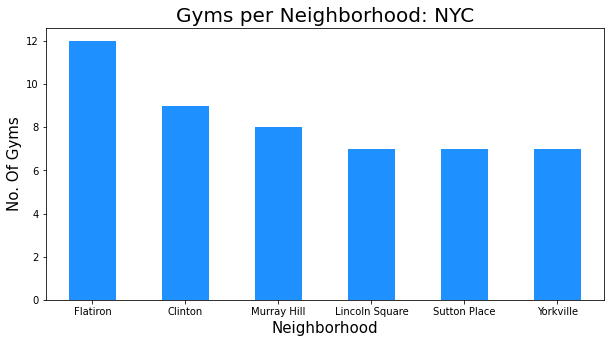

In [30]:
NOofGyms = 6 # top number for graphing all the same past 6
clr = "dodgerblue"
df_gym.groupby('Neighborhood')['Venue'].count().nlargest(NOofGyms).plot.bar(figsize=(10,5), color=clr)
plt.title('Gyms per Neighborhood: NYC', fontsize = 20)
plt.xlabel('Neighborhood', fontsize = 15)
plt.ylabel('No. Of Gyms', fontsize=15)
plt.xticks(rotation = 'horizontal')
plt.show()

In [34]:
# create map of NYC Gym using latitude and longitude values

latitude = 40.760280
longitude = -73.963556
map_gym = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat1, lng1, borough1, neighborhood1 in zip(df_gym['Venue Latitude'], df_gym['Venue Longitude'], df_gym['Borough'], df_gym['Neighborhood']):
    label = '{}, {}'.format(df_gym, borough1)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat1, lng1],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_gym)  
    
map_gym

## Exploratory Data Analysis for the Yoga Studio Category

In [35]:
df_yoga = df_final[(df_final.Venue_Category == "Yoga Studio")]
df_yoga.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue_Category,Borough
9068,Sutton Place,40.760280,-73.963556,Earth Yoga NYC,40.761271,-73.962045,Yoga Studio,Manhattan
3357,Chinatown,40.715618,-73.994279,Sky Ting Yoga,40.715352,-73.992666,Yoga Studio,Manhattan
1146,Bay Ridge,40.625801,-74.030621,Dahn Yoga,40.626273,-74.030208,Yoga Studio,Brooklyn
2579,Clinton Hill,40.693229,-73.967843,Sacred Brooklyn - Ft. Greene,40.693088,-73.973151,Yoga Studio,Brooklyn
2517,Clinton Hill,40.693229,-73.967843,Brooklyn Yoga Club,40.691249,-73.969435,Yoga Studio,Brooklyn


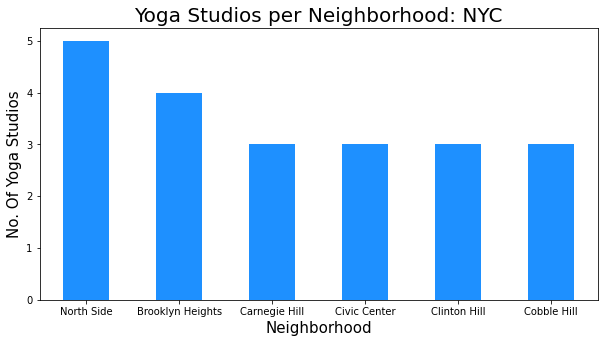

In [36]:
NOofGyms = 6 # top number for graphing all the same past 6
clr = "dodgerblue"
df_yoga.groupby('Neighborhood')['Venue'].count().nlargest(NOofGyms).plot.bar(figsize=(10,5), color=clr)
plt.title('Yoga Studios per Neighborhood: NYC', fontsize = 20)
plt.xlabel('Neighborhood', fontsize = 15)
plt.ylabel('No. Of Yoga Studios', fontsize=15)
plt.xticks(rotation = 'horizontal')
plt.show()

In [37]:
# create map of Yoga Studios using latitude and longitude values

latitude = 40.760280
longitude = -73.963556
map_yoga = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(df_yoga['Venue Latitude'], df_yoga['Venue Longitude'], df_yoga['Borough'], df_yoga['Neighborhood']):
    label = '{}, {}'.format(df_yoga, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_yoga)  
    
map_yoga

## OBSERVATIONS

From the results discovered and presented, the following observations and recommendations can be made:
Based on the criteria given by the All-Fit YK Center, the main neighborhood recommendation would be for the neighborhood of the Flatiron for the Gyms and Northside for the Gym Studios. These two areas will be the prime location for opening the Gym and Yoga Studio.

A secondary recommendation is made for the neighborhood of Clinton for Gyms and Brooklyn Heights for the Yoga Studio. 

## CONCLUSION

In conclusion, the scope of this analysis is only in the first stage. The second stage is to compare the user ratings and consider the account of the population in the neighborhoods. The Fitness industry is ever-changing, and the information afforded us may be dated due to relying on user information via Foursquare. Overall though, the model created can easily be replicated again and again with monitored data via the Foursquare API.
